c:\Users\Eesha\Documents\GitHub\testsima\Lib\site-packages\visualizer\plots\plots.py:519: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  self.fig, self.ax = plt.subplots(nrows=n_rows, ncols=int(n_columns),


{'heatmap': <Figure size 1200x300 with 6 Axes>, 'linegraph': <Figure size 500x400 with 1 Axes>}
{'heatmap': <Figure size 1200x300 with 6 Axes>, 'linegraph': <Figure size 500x400 with 1 Axes>}
{'heatmap': <Figure size 1200x300 with 6 Axes>, 'linegraph': <Figure size 500x400 with 1 Axes>}
{'heatmap': <Figure size 1200x300 with 6 Axes>, 'linegraph': <Figure size 500x400 with 1 Axes>}
{'heatmap': <Figure size 1200x300 with 6 Axes>, 'linegraph': <Figure size 500x400 with 1 Axes>}
{'heatmap': <Figure size 1200x300 with 6 Axes>, 'linegraph': <Figure size 500x400 with 1 Axes>}
{'heatmap': <Figure size 1200x300 with 6 Axes>, 'linegraph': <Figure size 500x400 with 1 Axes>}
{'heatmap': <Figure size 1200x300 with 6 Axes>, 'linegraph': <Figure size 500x400 with 1 Axes>}
{'heatmap': <Figure size 1200x300 with 6 Axes>, 'linegraph': <Figure size 500x400 with 1 Axes>}
{'heatmap': <Figure size 1200x300 with 6 Axes>, 'linegraph': <Figure size 500x400 with 1 Axes>}
{'heatmap': <Figure size 1200x300 with 6

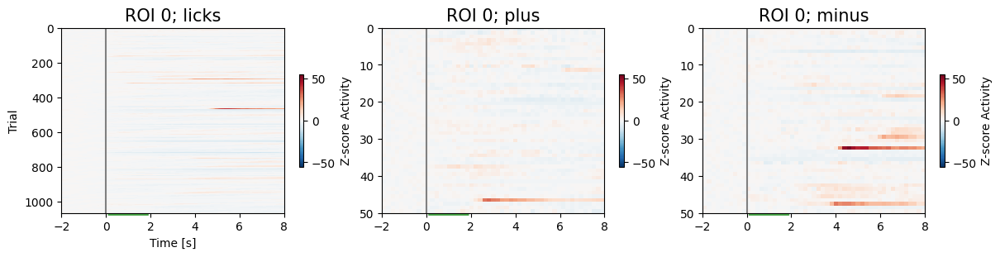

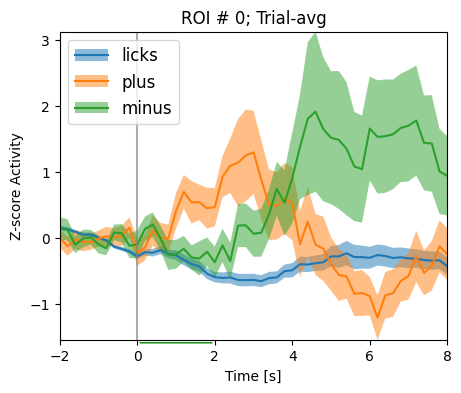

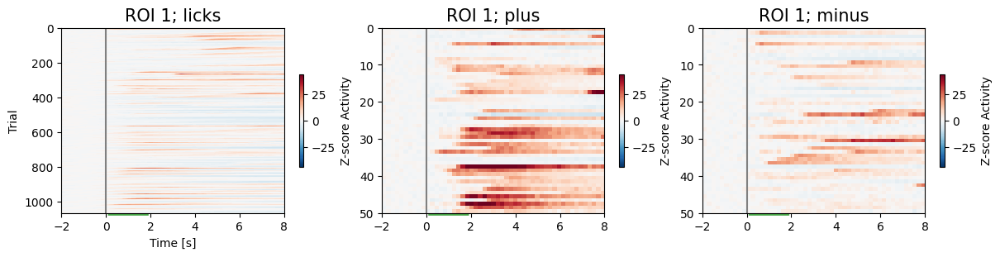

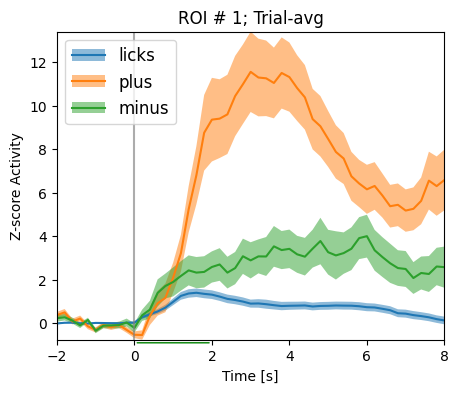

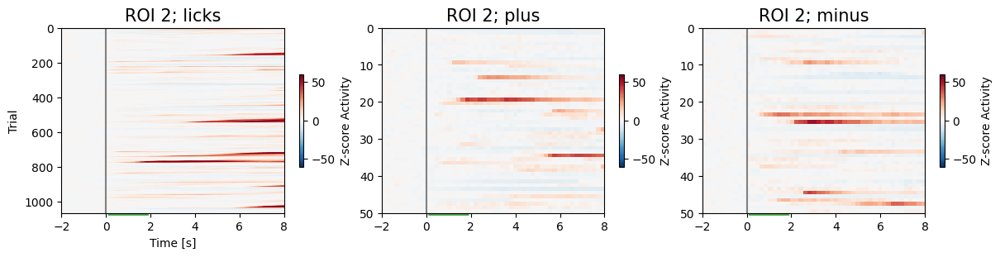

...

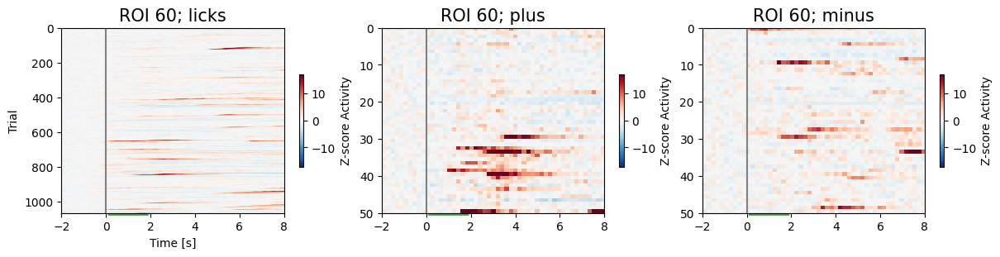

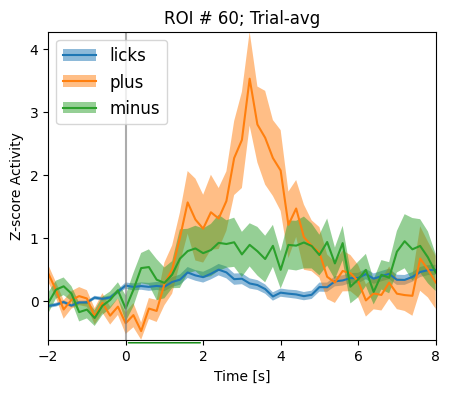

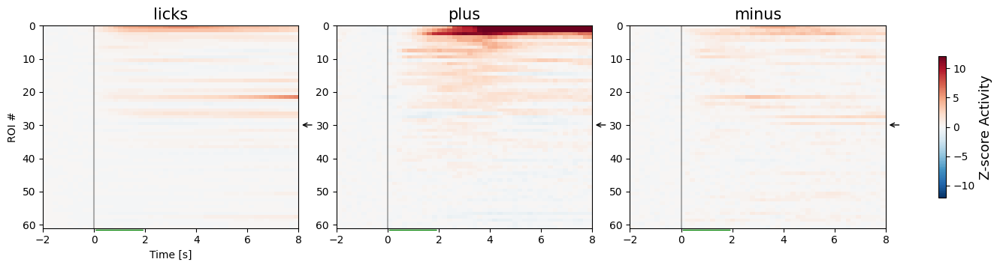

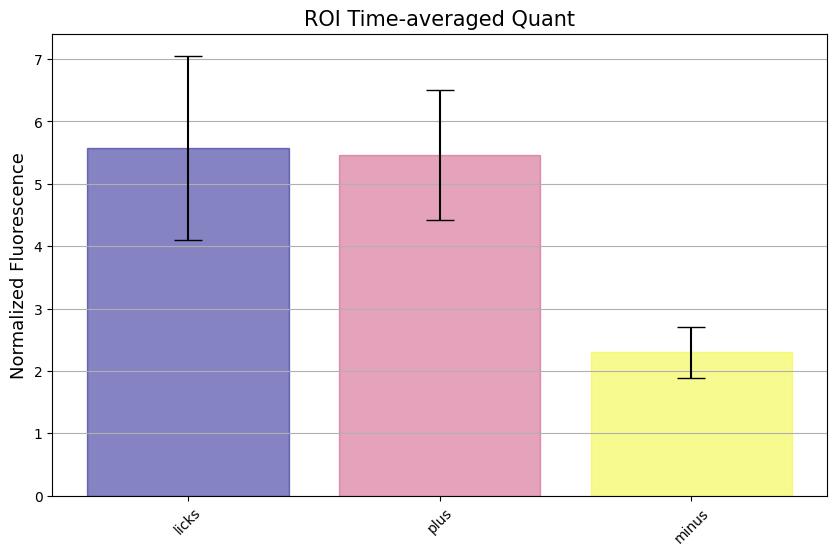

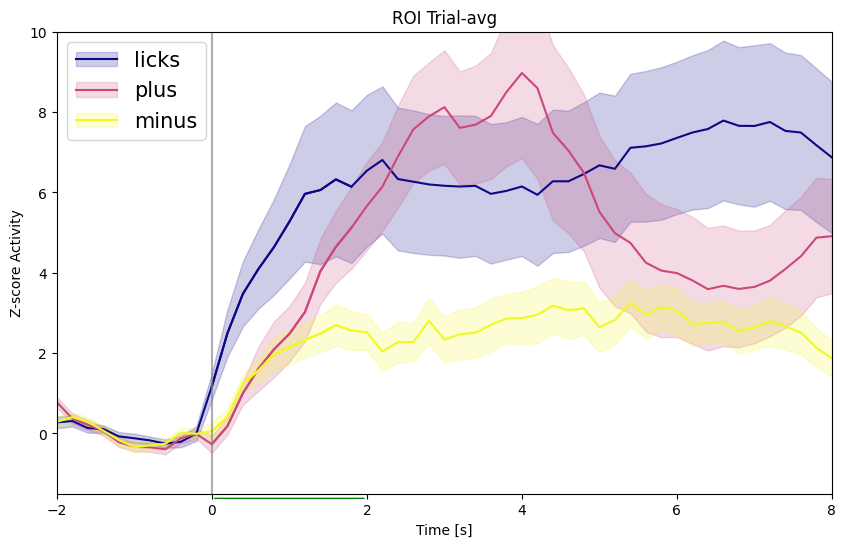

In [1]:
from visualizer.data import EventAnalysisProcessor
from visualizer.plots import EventAnalysisPlot
import os
import glob

# F PARAMS
fparams = {}

# set the sampling rate
fparams['fs'] = 5

# set to None if want to include all conditions from behav data; 
# otherwise, set to list of conditions, eg. ['plus', 'minus']
fparams['selected_conditions'] = None 

# trial windowing and normalization
fparams['trial_start_end'] = [-2, 8] # [start, end] times (in seconds) included in the visualization 
fparams['flag_normalization'] = 'zscore' # options: 'zscore', None
fparams['baseline_end'] = -0.2 # baseline epoch end time (in seconds) for performing baseline normalization
fparams['event_dur'] = 2 # duration of stim/event in seconds; displays a line below main plot indicating event duration
fparams['event_sort_analysis_win'] = [0, 5] # time window (in seconds)

# session info
fparams['opto_blank_frame'] = False # if PMTs were blanked during stim, set stim times to nan (instead of 0)

# ROI sorting; if flag_sort_rois is set to True, ROIs are sorted by activity in the fparams['event_sort_analysis_win'] window
fparams['flag_sort_rois'] = True
if fparams['flag_sort_rois']:
    
    fparams['user_sort_method'] = 'max_value' # peak_time or max_value
    fparams['roi_sort_cond'] = 'plus' # for roi-resolved heatmaps, which condition to sort ROIs by
    
# errorbar and saving figures
fparams['flag_roi_trial_avg_errbar'] = True # toggle to show error bar on roi- and trial-averaged traces
fparams['flag_trial_avg_errbar'] = True # toggle to show error bars on the trial-avg traces
fparams['interesting_rois'] = [0] #[ 0, 1, 2, 23, 22, 11, 9, 5, 6, 7, 3, 4, 8, 12, 14, 15, 16, 17] # [35, 30, 20, 4] #

if 'zscore' in fparams['flag_normalization']:
    fparams['data_trial_resolved_key'] = 'zdata'
    fparams['data_trial_avg_key'] = 'ztrial_avg_data'
    fparams['cmap_'] = None
    fparams['ylabel'] = 'Z-score Activity'
else:
    fparams['data_trial_resolved_key'] = 'data'
    fparams['data_trial_avg_key'] = 'trial_avg_data'
    fparams['cmap_'] = 'inferno'
    fparams['ylabel'] = 'Activity'

#Declare contents
fname_signal = 'VJ_OFCVTA_7_260_D6_neuropil_corrected_signals_15_50_beta_0.8.npy'
fname_events = 'event_times_VJ_OFCVTA_7_260_D6_trained.csv'
fdir = os.path.abspath('./sample_data/VJ_OFCVTA_7_260_D6')

signals_content = glob.glob(os.path.join(fdir, fname_signal))[0]
events_content = glob.glob(os.path.join(fdir, fname_events))[0]

# DATA PROCESSOR
data_processor = EventAnalysisProcessor(fparams, signals_content, events_content)
data_processor.generate_all_data()

visualization = EventAnalysisPlot(data_processor)
figs = visualization.generate_roi_plots()

for fig in figs:
    if "heatmap" in fig:
        fig["heatmap"]
    
    if "linegraph" in fig:
        fig["linegraph"]
    
    if "bargraph" in fig:
        fig["bargraph"]